<a href="https://colab.research.google.com/github/ppza53893/qiita_diff_loss_optim/blob/main/qiita_diff_loss_optim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [学習最適化のための損失関数とOptimizer & MRI画像を使った比較](https://qiita.com/ppza53893/items/8090322792e1c7f81e57) (モダン版)

注意: Colab、あるいはDocker環境内で[実際に試す](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#4-%E5%AE%9F%E9%9A%9B%E3%81%AB%E8%A9%A6%E3%81%99)を実行した際、以下のようなエラーがでた方はTensorflowを再インストールしてから実行してください:

> NotImplementedError: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.8/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.8/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow10FileSystem8BasenameESt17basic_string_viewIcSt11char_traitsIcEE']



In [ ]:
# エラーの場合は、次で解決できます
# !pip uninstall tensorflow -y -q
# !pip install tensorflow-gpu -q
# !pip install --no-deps tensorflow-io -q

## [2. 損失関数(Loss)](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#2-%E6%90%8D%E5%A4%B1%E9%96%A2%E6%95%B0loss)

### [Cross Entropy (CE)](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#cross-entropy-ce)

In [ ]:
import tensorflow as tf

# 2値クロスエントロピー
bce = tf.keras.losses.BinaryCrossentropy()
# 多クラスクロスエントロピー
cce = tf.keras.losses.CategoricalCrossentropy()

2022-10-14 12:09:19.777174: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-14 12:09:19.875243: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### [Dice Loss](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#dice-loss)

In [ ]:
def dice_loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
    smooth = 1. # ゼロ除算回避のための定数
    y_true_flat = tf.reshape(y_true, [-1]) # 1次元に変換
    y_pred_flat = tf.reshape(y_pred, [-1]) # 同様

    tp = tf.reduce_sum(y_true_flat * y_pred_flat) # True Positive
    nominator = 2 * tp + smooth # 分子
    denominator = tf.reduce_sum(y_true_flat) + tf.reduce_sum(y_pred_flat) + smooth # 分母
    score = nominator / denominator
    return 1. - score

In [ ]:
def bce_dice_loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
    return 0.5 *(bce(y_true, y_pred) + dice_loss(y_true, y_pred))

def cce_dice_loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
    return 0.5* (cce(y_true, y_pred) + dice_loss(y_true, y_pred))

### [Tversky Loss](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#tversky-loss)

In [ ]:
def tversky_loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
    alpha = 0.3 # FP、FNの重み
    smooth = 1. # ゼロ除算回避のための定数

    y_true_flat = tf.reshape(y_true, [-1]) # 1次元に変換
    y_pred_flat = tf.reshape(y_pred, [-1]) # 同様

    tp = tf.reduce_sum(y_true_flat * y_pred_flat) # True Positive
    fp = tf.reduce_sum((1 - y_true_flat) * y_pred_flat) # False Positive
    fn = tf.reduce_sum(y_true_flat * (1 - y_pred_flat)) # False Negative

    score = (tp + smooth)/(tp + alpha * fp + (1-alpha) * fn + smooth) # Tversky
    return 1. - score

In [ ]:
def focal_tversky_loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
    gamma = 0.75 # 1/(4/3)=3/4=0.75
    tversky = tversky_loss(y_true, y_pred)
    return tversky ** gamma

## [3. オプティマイザ (Optimizer)](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#3-%E3%82%AA%E3%83%97%E3%83%86%E3%82%A3%E3%83%9E%E3%82%A4%E3%82%B6-optimizer)

### [Stochastic Gradient Descent (SGD)](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#stochastic-gradient-descent-sgd)

In [ ]:
sgd = tf.keras.optimizers.SGD(
    learning_rate=0.01, # 学習率
    momentum=0.0, # momentumのβの値([0-1])。デフォルトは0なので、momentumは無効
    nesterov=False # nesterovを適用するかどうか。デフォルトは無効
)

### [RMSProp](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#rmsprop)

In [ ]:
rmsp = tf.keras.optimizers.RMSprop(
    learning_rate=0.001,
    rho=0.9,
    momentum=0.0,
    epsilon=1e-07,
    centered=False
)

### [Adaptive Moment Estimation (Adam)](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#adaptive-moment-estimation-adam)

In [ ]:
adam = tf.keras.optimizers.Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
)

## [4. 実際に試す](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#4-%E5%AE%9F%E9%9A%9B%E3%81%AB%E8%A9%A6%E3%81%99)

ここで使うデータセットは[こちら](https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation)からダウンロードできます。  
尚、ダウンロードにはkaggleでのユーザ登録(googleアカウントで可能)が必要になりますので、注意してください。  
ダウンロード後は、このファイルと同じディレクトリにアップロードし、以下のセルのコメントアウトを外し、実行してください。

In [ ]:
# import os
# import shutil
# shutil.unpack_archive('archive.zip')

実際に、MRIの画像を使ったセグメンテーションを行い、損失関数の違いとオプティマイザの違いを比べてみます。  
今回使用するのはKaggleのLGG Segmentation Datasetです。セグメンテーションコードは[MonKira氏のコード](https://www.kaggle.com/monkira/brain-mri-segmentation-using-unet-keras)をこの記事用に変えたものとなります。  

はじめに必要なモジュールをインポートします。

In [ ]:
#@title <font size=3>import tensorflow, numpy, etc.,</font>
!pip install keras-cv -q
!pip install tensorflow-datasets -q
!pip install tensorflow-io -q

import glob
import math
import os
import functools
from typing import Callable, Optional, Union

import cv2
import keras_cv  # RandomShearを使うため必要
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_io as tfio  # データセットの画像がtifのため必要

from sklearn.model_selection import train_test_split

tf.keras.utils.set_random_seed(0)

データセットの中身は次のようになります。

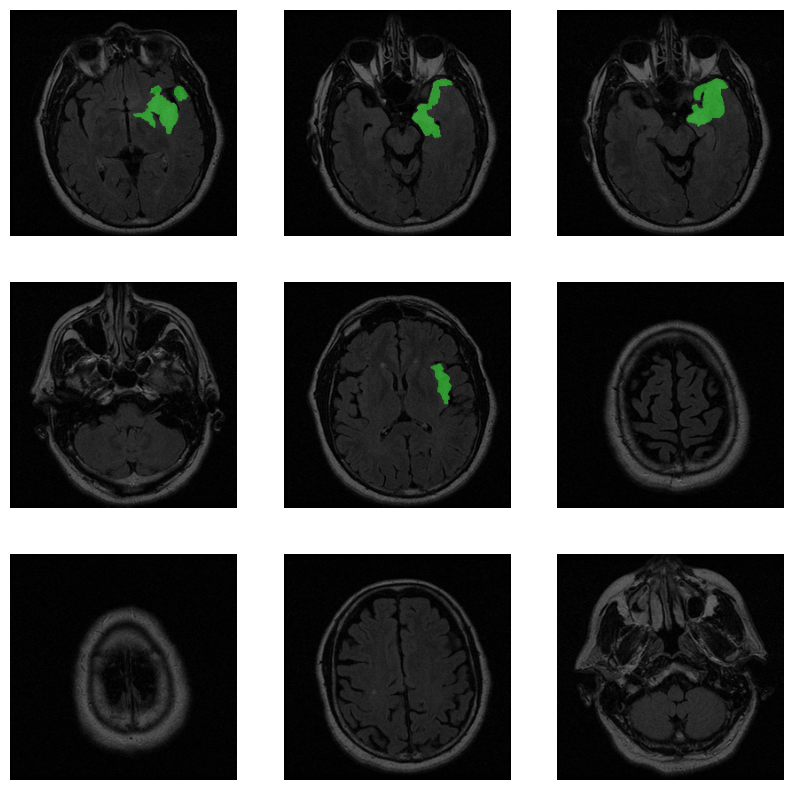

In [ ]:
#@title <font size=3>image: mask = 6:4で合成</font>
plt.style.use("ggplot")

DATASET_FOLDER = 'lgg-mri-segmentation/kaggle_3m'

# mask画像のあるリスト
mask_list = [p for p in glob.iglob(DATASET_FOLDER + '/*/*_mask*')]

# 画像のあるリスト
*img_list, = map(lambda p: p.replace('_mask', ''), mask_list)

# 幾つかのサンプルを表示
rows, cols = 3, 3
fig = plt.figure(figsize=(10, 10))

for i in range(1, rows * cols + 1):
    fig.add_subplot(rows, cols, i)

    img_path = img_list[i]
    mask_path = mask_list[i]

    # 画像の読み込み
    img = cv2.imread(img_path) * 0.6
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # 画像とマスクを合成
    img[:,:,1] = img[:,:,1] + mask * 0.4
    img = img.astype(np.uint16)

    # BGR -> RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off'); plt.grid('off')
plt.show()

緑の領域がマスクです。マスクの領域が小さかったり、そもそもないものもありますね。  
次にデータを分割します。

In [ ]:
# データの読み込み。
data_zip = list(zip(img_list, mask_list))

# データを分割
train_list, test_list = train_test_split(data_zip, test_size=0.1)
train_list, val_list = train_test_split(train_list, test_size=0.2)

print('train:', len(train_list))
print('val:', len(val_list))
print('test', len(test_list))

train: 2828
val: 708
test 393


学習時に使用する`tf.data.Dataset`を作る関数を定義します。

In [ ]:
#@title <font size=3>学習用のDatasetを作成</font>

AUTOTUNE = tf.data.AUTOTUNE


def tf_imread(path: tf.Tensor, input_size: tuple, is_mask: bool = False):
    raw = tf.io.read_file(path)
    if tf.strings.split(path, '.')[1] == 'tif':
        img = tfio.experimental.image.decode_tiff(raw)
        img = img[..., :3]
    else:
        # https://qiita.com/ppza53893/items/51e3e344b15b22c65b0d
        img = tf.image.decode_jpeg(
            raw, channels=3, dct_method="INTEGER_ACCURATE"
        )
    if is_mask:
        img = tf.image.rgb_to_grayscale(img)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, input_size)
    if is_mask:
        return tf.cast(img > 0.5, tf.float32)
    return img


def load_img(
    img_path, mask_path,
    input_size: tuple,
    augmenter: Optional[tf.keras.Sequential]
):
    img = tf_imread(img_path, input_size)
    mask = tf_imread(mask_path, input_size, True)

    if augmenter is not None:
        img, mask = augmenter(img, mask)
    return img, mask


def create_dataset(
    img_and_mask: list,
    batch_size: int,
    input_size: tuple,
    augmenter: Optional[tf.keras.Sequential] = None
) -> tf.data.Dataset:
    """
    model.fit用のDatasetを作成
    """
    img_paths, mask_paths = map(list, zip(*img_and_mask))
    ds = (tf.data.Dataset.from_tensor_slices((img_paths, mask_paths))
          .map(
              functools.partial(
                  load_img, input_size=input_size, augmenter=augmenter
                ),
              num_parallel_calls=AUTOTUNE
            )
          .batch(batch_size)
          .shuffle(buffer_size=1000)
          .prefetch(buffer_size=AUTOTUNE))
    return ds

Unetを構築します。構造は[MonKira氏のコード](https://www.kaggle.com/monkira/brain-mri-segmentation-using-unet-keras)を見やすくしたものになります

In [ ]:
#@title <font size=3>UNet</font>
def UNet(input_size: tuple = (256, 256, 3)) -> tf.keras.Model:
    inputs = tf.keras.Input(input_size)

    # encoder
    def encoder_block(inputs, filters, initial_pooling = False):
        if initial_pooling:
            inputs = tf.keras.layers.MaxPooling2D()(inputs)
        x = tf.keras.layers.Conv2D(
            filters, 3, padding='same', activation='relu')(inputs)
        skipx = tf.keras.layers.Conv2D(filters, 3, padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(skipx)
        x = tf.keras.layers.Activation('relu')(x)
        return skipx, x

    skip1, x = encoder_block(inputs, 64)
    skip2, x = encoder_block(x, 128, initial_pooling=True)
    skip3, x = encoder_block(x, 256, initial_pooling=True)
    skip4, x = encoder_block(x, 512, initial_pooling=True)
    _, x = encoder_block(x, 1024, initial_pooling=True)

    # decoder
    def decoder_block(x, skipx, filters):
        x = tf.keras.layers.Conv2DTranspose(
            filters, 2, strides=(2, 2), padding='same')(x)
        x = tf.keras.layers.Concatenate()([x, skipx])
        x = tf.keras.layers.Conv2D(
            filters, 3, padding='same', activation='relu')(x)
        x = tf.keras.layers.Conv2D(filters, 3, padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
        return x

    x = decoder_block(x, skip4, 512)
    x = decoder_block(x, skip3, 256)
    x = decoder_block(x, skip2, 128)
    x = decoder_block(x, skip1, 64)

    output = tf.keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    return tf.keras.Model(inputs, output)

base_model = UNet()
base_model.summary()

2022-10-14 12:09:21.991893: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-14 12:09:21.993338: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-14 12:09:21.993425: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-14 12:09:21.993752: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

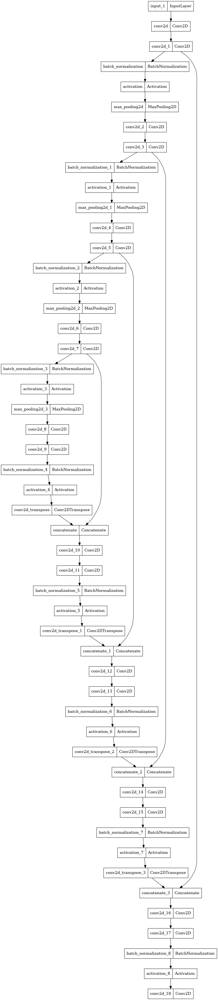

In [ ]:
#@title <font size=3>モデル構造はGraphvizがあると分かりやすく見れます</font>

# colabでは不要ですが、別の環境(例えばDockerやconda内)であれば
# !sudo apt install graphviz -y
# !pip install plotly
# !pip install graphviz
# をすると下のコードは動きます。
tf.keras.utils.plot_model(base_model)

使う損失関数/評価関数を定義しておきます。評価指標にはDice係数、感度、特異度を使います。

In [ ]:
def tversky_loss(y_true: tf.Tensor, y_pred: tf.Tensor):
    alpha = 0.3 # FP、FNの重み
    smooth = 1. # ゼロ除算回避のための定数
    y_true_pos = tf.reshape(y_true, (-1,)) # 1次元に畳み込み
    y_pred_pos = tf.reshape(y_pred, (-1,)) # 同様

    tp = tf.reduce_sum(y_true_pos * y_pred_pos) # TP
    fp = tf.reduce_sum((1 - y_true_pos) * y_pred_pos) # FP
    fn = tf.reduce_sum(y_true_pos * (1 - y_pred_pos)) # FN

    score = ((tp + smooth)
             / (tp + alpha * fp + (1-alpha) * fn + smooth)) # Tversky係数を計算
    return 1. - score


def dice_coeff(y_true: tf.Tensor, y_pred: tf.Tensor):
    smooth = 1. # ゼロ除算回避のための定数
    y_true_pos = tf.reshape(y_true, (-1,)) # 1次元に畳み込み
    y_pred_pos = tf.reshape(y_pred, (-1,)) # 同様
    tp = tf.reduce_sum(y_true_pos * y_pred_pos) # TP
    score = (
        (2. * tp + smooth)
        / (tf.reduce_sum(y_true_pos) + tf.reduce_sum(y_pred_pos) + smooth)
    ) # Dice係数を計算
    return score


def dice_loss(y_true: tf.Tensor, y_pred: tf.Tensor):
    return 1. - dice_coeff(y_true, y_pred)


def sensitivity(y_true: tf.Tensor, y_pred: tf.Tensor):
    smooth = 1.
    y_true_pos = tf.reshape(y_true, (-1,)) # 1次元に畳み込み
    y_pred_pos = tf.reshape(y_pred, (-1,)) # 同様

    tp = tf.reduce_sum(y_true_pos * y_pred_pos) # TP
    fn = tf.reduce_sum(y_true_pos * (1 - y_pred_pos)) # FN

    score = (tp + smooth) / (tp + fn + smooth)
    return score


def specificity(y_true: tf.Tensor, y_pred: tf.Tensor):
    smooth = 1.
    y_true_pos = tf.reshape(y_true, (-1,)) # 1次元に畳み込み
    y_pred_pos = tf.reshape(y_pred, (-1,)) # 同様

    tn = tf.reduce_sum((1 - y_true_pos) * (1 - y_pred_pos)) # TN
    fp = tf.reduce_sum((1 - y_true_pos) * y_pred_pos) # FP

    score = (tn + smooth)/(tn + fp + smooth)
    return score


In [ ]:
#@title <font size=3>今回は入力サイズを256x256、エポックは25、バッチサイズは32にします。</font>
SIZE = 256 #@param {type:"number"}
SIZE = (SIZE, SIZE)
EPOCHS = 25  #@param {type:"number"}
BATCH_SIZE = 32  #@param {type:"number"}

学習データで使うデータ増強用のクラスを作ります。

In [ ]:
class Augmenter(tf.keras.layers.Layer):
    def __init__(self, seed = 0):
        super().__init__()
        share_kwargs = dict(seed=seed, fill_mode='nearest')
        # both use the same seed, so they'll make the same random changes.
        self.img_augmenter = tf.keras.Sequential([
            tf.keras.layers.RandomFlip('horizontal', seed=seed),
            tf.keras.layers.RandomRotation(0.2, **share_kwargs),
            tf.keras.layers.RandomZoom(0.2, 0.2, **share_kwargs),
            tf.keras.layers.RandomTranslation(0.2, 0.2, **share_kwargs),
            keras_cv.layers.RandomShear(0.05, 0.05, **share_kwargs),
        ])
        self.mask_augmenter = tf.keras.Sequential([
            tf.keras.layers.RandomFlip('horizontal', seed=seed),
            tf.keras.layers.RandomRotation(0.2, **share_kwargs),
            tf.keras.layers.RandomZoom(0.2, 0.2, **share_kwargs),
            tf.keras.layers.RandomTranslation(0.2, 0.2, **share_kwargs),
            keras_cv.layers.RandomShear(0.05, 0.05, **share_kwargs),
        ])

    def call(self, image, mask):
        augmented_image = self.img_augmenter(image)
        augmented_mask = self.mask_augmenter(mask)
        return augmented_image, augmented_mask

In [ ]:
#@title <font size=3>学習を複数するため、学習用の関数を作っておきます。</font>

def train_model(
    optimizer: tf.keras.optimizers.Optimizer,
    loss_fn: Union[Callable[[tf.Tensor, tf.Tensor], tf.Tensor], str],
    weight_path: str = 'model_weights.h5',
    logdir: str = './logs'
) -> None:
    # データセット作成
    train_ds = create_dataset(
        train_list, batch_size=BATCH_SIZE, input_size=SIZE, augmenter=Augmenter())
    val_ds = create_dataset(
        val_list, batch_size=BATCH_SIZE, input_size=SIZE)

    # モデルを複製
    model = tf.keras.models.clone_model(base_model)

    # コールバック
    ## val_lossが更新されたときだけmodelを保存
    mc_cb = tf.keras.callbacks.ModelCheckpoint(
        weight_path, verbose=1, save_best_only=True,
        save_weights_only=True, mode='min'
    )
    ## 学習が停滞したとき、学習率を0.2倍に
    rl_cb = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss', factor=0.2, patience=5, verbose=1
    )
    ## 学習が進まなくなったら、強制的に学習終了
    es_cb = tf.keras.callbacks.EarlyStopping(
        monitor='loss', patience=8, verbose=1
    )
    tb_cb = tf.keras.callbacks.TensorBoard(logdir)

    model.compile(
        optimizer=optimizer,
        loss=loss_fn,
        metrics=[dice_coeff, sensitivity, specificity]
    )

    model.fit(
        x=train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=[mc_cb, rl_cb, es_cb, tb_cb]
    )
    return model

# [損失関数の比較](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#%E6%90%8D%E5%A4%B1%E9%96%A2%E6%95%B0%E3%81%AE%E6%AF%94%E8%BC%83)

今回は損失関数の比較は2値クロスエントロピー、Dice損失、tversky損失とします。  
オプティマイザはSGD+Momentum+Nesterovでやってみました。

In [ ]:
#@title <font size=3>BCE vs Dice vs Tversky</font>
tb_logdir = './logs'

# bce
sgd_bce = train_model(
    optimizer=tf.keras.optimizers.SGD(momentum=0.9, nesterov=True),
    loss_fn='binary_crossentropy',
    weight_path='model_weights_bce.h5',
    logdir=os.path.join(tb_logdir, 'sgd_bce')
)

# dice
sgd_dice = train_model(
    optimizer=tf.keras.optimizers.SGD(momentum=0.9, nesterov=True),
    loss_fn=dice_loss,
    weight_path='model_weights_dice.h5',
    logdir=os.path.join(tb_logdir, 'sgd_dice')
)

# tversky
sgd_tversky = train_model(
    optimizer=tf.keras.optimizers.SGD(momentum=0.9, nesterov=True),
    loss_fn=tversky_loss,
    weight_path='model_weights_tversky.h5',
    logdir=os.path.join(tb_logdir, 'sgd_tversky')
)

2022-10-14 12:09:22.951054: I tensorflow_io/core/kernels/cpu_check.cc:128] Your CPU supports instructions that this TensorFlow IO binary was not compiled to use: AVX2 FMA


Epoch 1/25


2022-10-14 12:09:27.327835: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8401
2022-10-14 12:09:31.926542: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


89/89 [==============================] - ETA: 0s - loss: 0.0879 - dice_coeff: 0.1053 - sensitivity: 0.1806 - specificity: 0.9450
Epoch 1: val_loss improved from inf to 0.24348, saving model to model_weights_bce.h5
89/89 [==============================] - 80s 612ms/step - loss: 0.0879 - dice_coeff: 0.1053 - sensitivity: 0.1806 - specificity: 0.9450 - val_loss: 0.2435 - val_dice_coeff: 0.0219 - val_sensitivity: 0.2648 - val_specificity: 0.7943 - lr: 0.0100
Epoch 2/25
89/89 [==============================] - ETA: 0s - loss: 0.0275 - dice_coeff: 0.2849 - sensitivity: 0.3327 - specificity: 0.9903
Epoch 2: val_loss improved from 0.24348 to 0.10833, saving model to model_weights_bce.h5
89/89 [==============================] - 47s 514ms/step - loss: 0.0275 - dice_coeff: 0.2849 - sensitivity: 0.3327 - specificity: 0.9903 - val_loss: 0.1083 - val_dice_coeff: 0.0261 - val_sensitivity: 0.1581 - val_specificity: 0.9173 - lr: 0.0100
Epoch 3/25
89/89 [==============================] - ETA: 0s - loss:

processing:   0%|          | 0/40 [00:00<?, ?it/s]

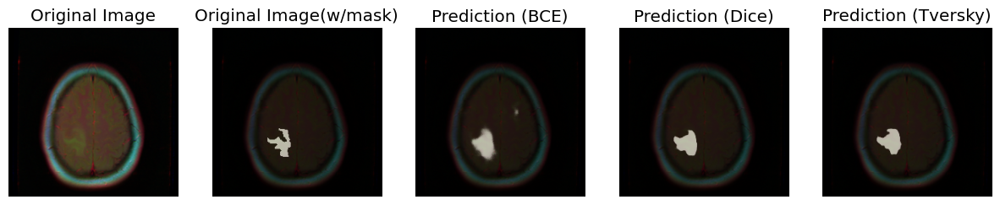

In [ ]:
#@title <font size=3>結果をテストデータを使って可視化してみます</font>

from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from tqdm.auto import tqdm

test_ds = create_dataset(test_list, batch_size=1, input_size=SIZE)

def show_predictions(models: list, names: list):
    fig, axs = plt.subplots(1, 2 + len(models), figsize=(3 * (2 + len(models)), 3))

    frames = []
    def draw(data):
        imgs, masks = data
        img = imgs.numpy()[0, ..., ::-1]
        for a in axs:
            a.cla()
        axs[0].imshow(img)
        axs[0].axis('off'); axs[0].grid(False)
        axs[0].set_title('Original Image')

        masked_img = img * 0.4 +  masks.numpy()[0] * 0.6
        axs[1].imshow(masked_img)
        axs[1].axis('off'); axs[1].grid(False)
        axs[1].set_title('Original Image(w/mask)')

        for i, (model, name) in enumerate(zip(models, names)):
            idx = i + 2
            pred = model.predict(imgs, verbose=0)[0]
            pred = imgs.numpy()[0, ..., ::-1] * 0.4 + pred * 0.6
            axs[idx].imshow(pred)
            axs[idx].axis('off')
            axs[idx].grid(False)
            axs[idx].set_title(f'Prediction ({name})')

    anim = FuncAnimation(fig, draw, frames=tqdm(test_ds.take(40), desc='processing'), interval=1000)
    return HTML(anim.to_jshtml())

show_predictions([sgd_bce, sgd_dice, sgd_tversky], ['BCE', 'Dice', 'Tversky'])

### [オプティマイザの比較](https://qiita.com/ppza53893/items/8090322792e1c7f81e57#%E3%82%AA%E3%83%97%E3%83%86%E3%82%A3%E3%83%9E%E3%82%A4%E3%82%B6%E3%81%AE%E6%AF%94%E8%BC%83)

オプティマイザは損失をDice損失として、SGD(+Momentum+Nesterov)、RMSProp、Adamで比較してみます。

In [ ]:
#@title <font size=3>RMSprop & Adam (SGDは2つ前のセルの結果)</font>

# RMSprop
rms_dice = train_model(
    optimizer=tf.keras.optimizers.RMSprop(),
    loss_fn=dice_loss,
    weight_path='model_weights_rms.h5',
    logdir=os.path.join(tb_logdir, 'rms_dice')
)

# Adam
adam_dice = train_model(
    optimizer=tf.keras.optimizers.Adam(),
    loss_fn=dice_loss,
    weight_path='model_weights_adam.h5',
    logdir=os.path.join(tb_logdir, 'adam_dice')
)

processing:   0%|          | 0/40 [00:00<?, ?it/s]

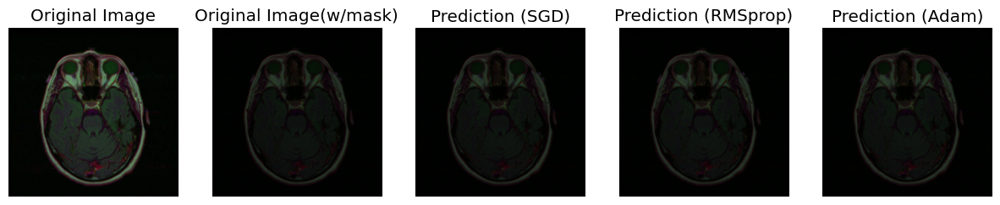

In [ ]:
#@title <font size=3>先ほど同様に、結果を可視化してみます。</font>
show_predictions([sgd_dice, rms_dice, adam_dice], ['SGD', 'RMSprop', 'Adam'])

## 結果

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir logdir
# or -> https://tensorboard.dev/experiment/mMMeqx0xRoi6WrsblZBzCQ